In [1]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import cmocean.cm as cm
import xarray as xr
import copy
from salishsea_tools import visualisations as vis
from salishsea_tools import viz_tools
import glob 

In [2]:
new_data = xr.open_dataset('/ocean/jtao/MOAD/extractions/SalishSeaCast_wastewater_month_nitrate_diatoms_flagellates_20180101_20201231.nc')
new_data = new_data.drop(['time'])
time_values = ['2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08', '2018-09', '2018-10','2018-11', '2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12', '2020-01','2020-02', '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12']
new_data = new_data.assign_coords(time = time_values)
new_data

<xarray.Dataset>
Dimensions:      (time: 36, depth: 40, gridY: 898, gridX: 398)
Coordinates:
  * depth        (depth) float32 0.5 1.5 2.5 3.5 4.5 ... 360.7 387.6 414.5 441.5
  * gridY        (gridY) int64 0 1 2 3 4 5 6 7 ... 891 892 893 894 895 896 897
  * gridX        (gridX) int64 0 1 2 3 4 5 6 7 ... 391 392 393 394 395 396 397
  * time         (time) <U7 '2018-01' '2018-02' ... '2020-11' '2020-12'
Data variables:
    nitrate      (time, depth, gridY, gridX) float32 ...
    diatoms      (time, depth, gridY, gridX) float32 ...
    flagellates  (time, depth, gridY, gridX) float32 ...
Attributes:
    name:         SalishSeaCast_wastewater_month_nitrate_diatoms_flagellates_...
    description:  Month-averaged Nitrate Diatoms Flagellates extracted from S...
    history:      2023-11-28 22:56 -08:00: Generated by `reshapr extract /oce...
    Conventions:  CF-1.6

In [3]:
meshmask = xr.open_dataset('/home/sallen/MEOPAR/grid/mesh_mask202108.nc')
cm_bwr = copy.copy(cm.balance)
cm_bwr.set_bad('grey')
tmask = meshmask.tmask[0]
tmask = tmask.rename({'z' : 'depth', 'y': 'gridY', 'x': 'gridX'})
area = meshmask.e1t[0] * meshmask.e2t[0]
area = area.rename({'y': 'gridY'})
area = area.rename({'x': 'gridX'})
area
volumn = meshmask.e1t[0] * meshmask.e2t[0] * meshmask.e3t_0[0]
volumn = volumn.rename({'z' : 'depth'})
volumn = volumn.rename({'y' : 'gridY'})
volumn = volumn.rename({'x' : 'gridX'})
volumn

<xarray.DataArray (gridY: 898, gridX: 398, depth: 40)>
array([[[ 185243.37452372,  185244.08957647,  185245.48230844, ...,
         4988602.12148864, 4988890.54061969, 4989038.63339594],
        [ 190803.49776947,  190804.23428469,  190805.66881984, ...,
         5138336.18183385, 5138633.25793263, 5138785.79574822],
        [ 194672.17811027,  194672.92955888,  194674.39318027, ...,
         5242519.70259455, 5242822.80212832, 5242978.43275958],
        ...,
        [ 231245.03207738,  231245.92469983,  231247.66329022, ...,
         6227426.27406199, 6227786.3165811 , 6227971.18537267],
        [ 231250.84481954,  231251.73746443,  231253.47609851, ...,
         6227582.81114701, 6227942.8627164 , 6228127.73615497],
        [ 231256.65316662,  231257.54583394,  231259.28451169, ...,
         6227739.22987272, 6228099.29048557, 6228284.16856761]],

       [[ 185143.43441715,  185144.14908412,  185145.5410647 , ...,
         4985910.73547314, 4986198.99900004, 4986347.01187919],
        [ 190700.34398872,  190701.08010577,  190702.51386536, ...,
         5135558.25160667, 5135855.16709769, 5136007.62244701],
        [ 194576.87296009,  194577.62404081,  194579.08694566, ...,
         5239953.13590566, 5240256.08705178, 5240411.64149136],
...
        [ 177713.73998053,  177714.42596835,  177715.76208959, ...,
         4785829.142683  , 4786105.8383683 , 4786247.91157982],
        [ 177057.6964592 ,  177058.37991464,  177059.71110349, ...,
         4768161.89757515, 4768437.5718177 , 4768579.12055537],
        [ 176408.84861791,  176409.52956875,  176410.85587931, ...,
         4750688.43205494, 4750963.09605822, 4751104.12607462]],

       [[ 238327.01473203,  238327.93469145,  238329.72652694, ...,
         6418143.99223245, 6418515.06121492, 6418705.59169602],
        [ 238155.19081508,  238156.11011125,  238157.9006549 , ...,
         6413516.77596178, 6413887.57741887, 6414077.97053537],
        [ 237066.46303945,  237067.37813305,  237069.16049122, ...,
         6384197.3484508 , 6384566.45478697, 6384755.97752028],
        ...,
        [ 177165.58040949,  177166.26428137,  177167.59628134, ...,
         4771067.2112183 , 4771343.05343336, 4771484.68841883],
        [ 176356.6297533 ,  176357.31050258,  176358.63642053, ...,
         4749282.17858214, 4749556.761282  , 4749697.74955204],
        [ 175504.07273636,  175504.7501947 ,  175506.0697028 , ...,
         4726322.82711085, 4726596.08240155, 4726736.38909506]]])
Dimensions without coordinates: gridY, gridX, depth

In [4]:
mesh = nc.Dataset('/home/sallen/MEOPAR/grid/mesh_mask202108.nc')
bathy = nc.Dataset('/home/sallen/MEOPAR/grid/bathymetry_202108.nc')
mesh_mask_depth_var='gdept_0'
thalweg_file = '/home/sallen/MEOPAR/Tools/bathymetry/thalweg_working.txt'
depth = mesh.variables[mesh_mask_depth_var][:]
thalweg_pts = np.loadtxt(thalweg_file, delimiter=' ', dtype=int)

In [5]:
cm_rain = copy.copy(cm.rain)
cm_rain.set_bad('grey')

cm_algae = copy.copy(cm.algae)
cm_algae.set_bad('grey')

In [6]:
month_names = {
    1: "January",
    2: "February",
    3: "March",
    4: "April",
    5: "May",
    6: "June",
    7: "July",
    8: "August",
    9: "September",
    10: "October",
    11: "November",
    12: "December",

    13: "January",
    14: "February",
    15: "March",
    16: "April",
    17: "May",
    18: "June",
    19: "July",
    20: "August",
    21: "September",
    22: "October",
    23: "November",
    24: "December"
}

In [7]:
jan18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180101_20180131.nc'
feb18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180201_20180228.nc'
mar18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180301_20180331.nc'
apr18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180401_20180430.nc'
may18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180501_20180531.nc'
jun18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180601_20180630.nc'
jul18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180701_20180731.nc'
aug18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180801_20180831.nc'
sep18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20180901_20180930.nc'
octo18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20181001_20181031.nc'
nov18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20181101_20181130.nc'
dec18 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20181201_20181231.nc'

jan19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190101_20190131.nc'
feb19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190201_20190228.nc'
mar19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190301_20190331.nc'
apr19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190401_20190430.nc'
may19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190501_20190531.nc'
jun19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190601_20190630.nc'
jul19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190701_20190731.nc'
aug19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190801_20190831.nc'
sep19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20190901_20190930.nc'
octo19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20191001_20191031.nc'
nov19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20191101_20191130.nc'
dec19 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20191201_20191231.nc'

jan20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200101_20200131.nc'
feb20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200201_20200229.nc'
mar20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200301_20200331.nc'
apr20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200401_20200430.nc'
may20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200501_20200531.nc'
jun20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200601_20200630.nc'
jul20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200701_20200731.nc'
aug20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200801_20200831.nc'
sep20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20200901_20200930.nc'
octo20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20201001_20201031.nc'
nov20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20201101_20201130.nc'
dec20 = '/results2/SalishSea/month-avg.202111/SalishSeaCast_1m_biol_T_20201201_20201231.nc'


In [8]:
jan_file_list = glob.glob(jan18)
feb_file_list = glob.glob(feb18)
mar_file_list = glob.glob(mar18)
apr_file_list = glob.glob(apr18)
may_file_list = glob.glob(may18)
jun_file_list = glob.glob(jun18)
jul_file_list = glob.glob(jul18)
aug_file_list = glob.glob(aug18)
sep_file_list = glob.glob(sep18)
octo_file_list = glob.glob(octo18)
nov_file_list = glob.glob(nov18)
dec_file_list = glob.glob(dec18)

jan_file_list19 = glob.glob(jan19)
feb_file_list19 = glob.glob(feb19)
mar_file_list19 = glob.glob(mar19)
apr_file_list19 = glob.glob(apr19)
may_file_list19 = glob.glob(may19)
jun_file_list19 = glob.glob(jun19)
jul_file_list19 = glob.glob(jul19)
aug_file_list19 = glob.glob(aug19)
sep_file_list19 = glob.glob(sep19)
octo_file_list19 = glob.glob(octo19)
nov_file_list19 = glob.glob(nov19)
dec_file_list19 = glob.glob(dec19)

jan_file_list20 = glob.glob(jan20)
feb_file_list20 = glob.glob(feb20)
mar_file_list20 = glob.glob(mar20)
apr_file_list20 = glob.glob(apr20)
may_file_list20 = glob.glob(may20)
jun_file_list20 = glob.glob(jun20)
jul_file_list20 = glob.glob(jul20)
aug_file_list20 = glob.glob(aug20)
sep_file_list20 = glob.glob(sep20)
octo_file_list20 = glob.glob(octo20)
nov_file_list20 = glob.glob(nov20)
dec_file_list20 = glob.glob(dec20)

In [9]:
all_file_list = jan_file_list + feb_file_list + mar_file_list + apr_file_list + may_file_list + jun_file_list + jul_file_list + aug_file_list + sep_file_list + octo_file_list + nov_file_list + dec_file_list + jan_file_list19 + feb_file_list19 + mar_file_list19 + apr_file_list19 + may_file_list19 + jun_file_list19 + jul_file_list19 + aug_file_list19 + sep_file_list19 + octo_file_list19 + nov_file_list19 +dec_file_list19 + jan_file_list20 + feb_file_list20 + mar_file_list20 + apr_file_list20 + may_file_list20 + jun_file_list20 + jul_file_list20 + aug_file_list20 + sep_file_list20 + octo_file_list20 + nov_file_list20 + dec_file_list20
base_data_nitrate = xr.open_mfdataset(all_file_list, data_vars=['nitrate'])
base_data_diatoms = xr.open_mfdataset(all_file_list, data_vars=['diatoms'])
base_data_flagellates = xr.open_mfdataset(all_file_list, data_vars=['flagellates'])

In [10]:
base_data_nitrate = base_data_nitrate.drop(['time'])
time_values = ['2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08', '2018-09', '2018-10','2018-11', '2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12', '2020-01','2020-02', '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12']
base_data_nitrate = base_data_nitrate.assign_coords(time = time_values)

In [11]:
base_data_diatoms = base_data_diatoms.drop(['time'])
time_values = ['2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08', '2018-09', '2018-10','2018-11', '2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12', '2020-01','2020-02', '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12']
base_data_diatoms = base_data_diatoms.assign_coords(time = time_values)

In [12]:
base_data_flagellates = base_data_flagellates.drop(['time'])
time_values = ['2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08', '2018-09', '2018-10','2018-11', '2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12', '2020-01','2020-02', '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12']
base_data_flagellates = base_data_flagellates.assign_coords(time = time_values)

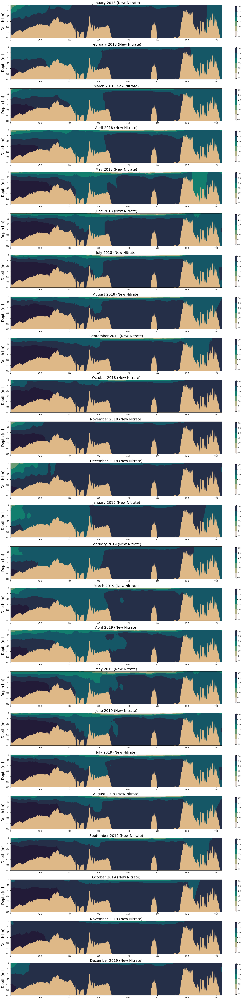

In [13]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(new_data.nitrate[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(0, 35, 5), 
                                     cmap=cm_rain, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(300, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (New Nitrate)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (New Nitrate)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

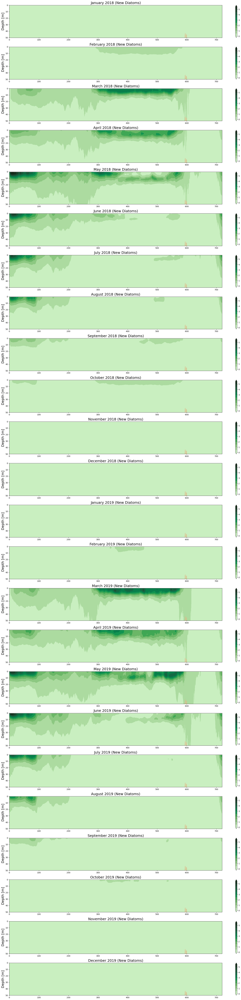

In [38]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(new_data.diatoms[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(0, 6, 0.5), 
                                     cmap=cm_algae, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(50, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (New Diatoms)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (New Diatoms)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

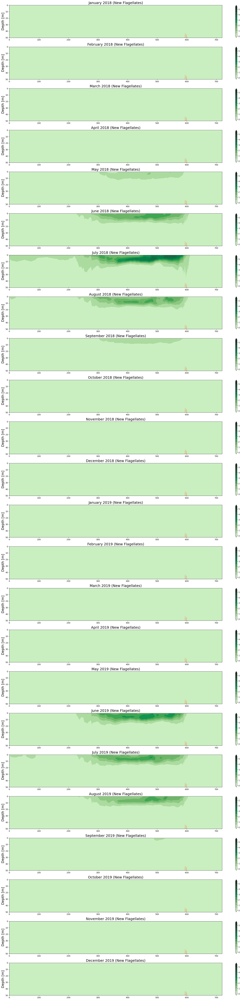

In [39]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(new_data.flagellates[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(0, 6, 0.5), 
                                     cmap=cm_algae, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(50, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (New Flagellates)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (New Flagellates)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

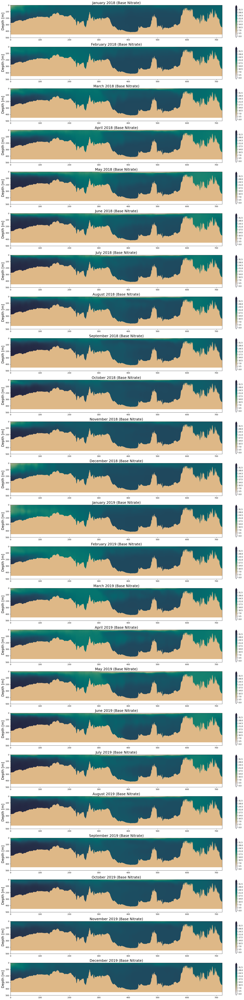

In [16]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(base_data_nitrate.nitrate[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(0, 35, 0.1), 
                                     cmap=cm_rain, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(500, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (Base Nitrate)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (Base Nitrate)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

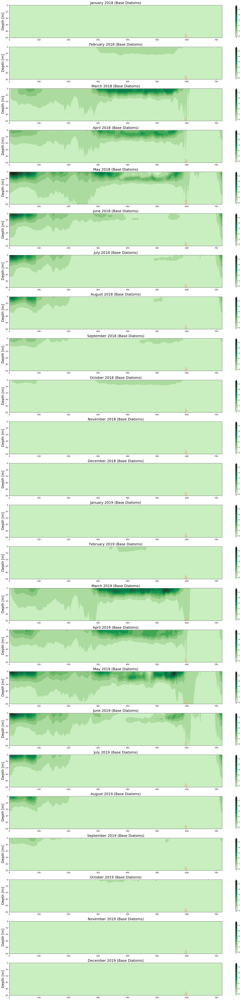

In [36]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(base_data_diatoms.diatoms[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(0, 6, 0.5), 
                                     cmap=cm_algae, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(50, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (Base Diatoms)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (Base Diatoms)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

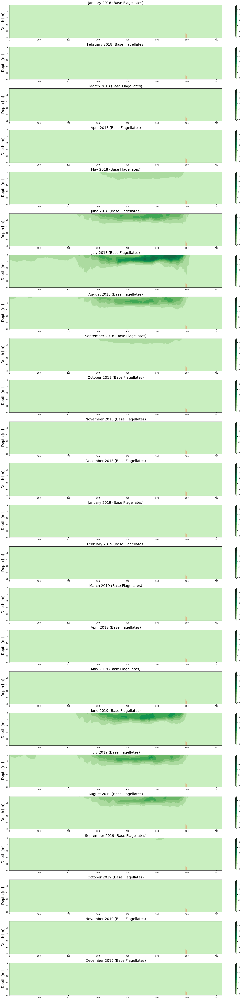

In [37]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(base_data_flagellates.flagellates[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(0, 6, 0.5), 
                                     cmap=cm_algae, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(50, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (Base Flagellates)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (Base Flagellates)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

In [19]:
diff_nitrate = new_data['nitrate'] - base_data_nitrate['nitrate']

In [20]:
diff_diatoms = new_data['diatoms'] - base_data_diatoms['diatoms']

In [21]:
diff_flagellates = new_data['flagellates'] - base_data_flagellates['flagellates']

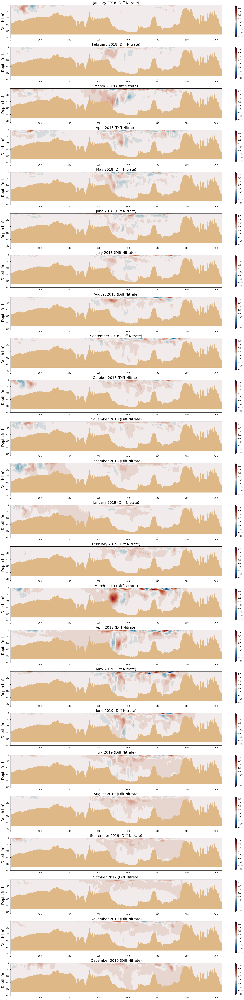

In [22]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(diff_nitrate[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(-2.5, 2.7, 0.2), 
                                     cmap=cm_bwr, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(500, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (Diff Nitrate)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (Diff Nitrate)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

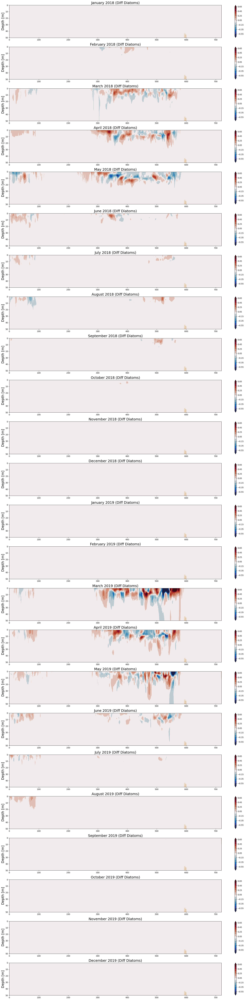

In [23]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(diff_diatoms[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(-0.65, 0.75, 0.1), 
                                     cmap=cm_bwr, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(50, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (Diff Diatoms)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (Diff Diatoms)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()

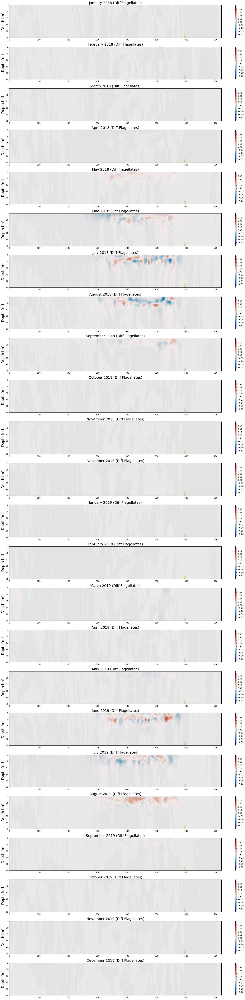

In [24]:
fig, axs = plt.subplots(24, 1, figsize=(20, 72))
jp = 0
for month in range(1, 24+1):
    dep_thal, distance, var_thal = vis.load_thalweg(
                depth[0, ...], np.array(diff_flagellates[month-1]), bathy['nav_lon'][:], bathy['nav_lat'][:],
                thalweg_pts)
    var_plot = vis._fill_in_bathy(var_thal, mesh, thalweg_pts)
    colours = axs[jp].contourf(distance, dep_thal, var_plot, np.arange(-0.6, 0.65, 0.01), 
                                     cmap=cm_bwr, extend='both')
    #axs[jp].contour(distance, dep_thal, var_plot, [2e-5, 1e-4], colors='green')
    vis._add_bathy_patch(
            distance, bathy['Bathymetry'][:], thalweg_pts, axs[jp], color='burlywood')
    cbar = fig.colorbar(colours, ax=axs[jp])
    axs[jp].invert_yaxis()
    axs[jp].set_ylim(50, 0)
    axs[jp].set_ylabel('Depth [m]', fontsize = 18)
    if month > 12:
        axs[jp].set_title(f'{month_names[month]} 2019 (Diff Flagellates)', fontsize = 18)
    else:
        axs[jp].set_title(f'{month_names[month]} 2018 (Diff Flagellates)', fontsize = 18)
    jp = jp + 1
fig.tight_layout()